In [1]:
!pip install torchmetrics

In [2]:
import os
import cv2
import numpy as np
from PIL import Image
import albumentations as A
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import torch.nn.functional as F


In [3]:
torch.manual_seed(42)
np.random.seed(42)

In [4]:
with open('/kaggle/input/smartphone-image-denoising-dataset/SIDD_Small_sRGB_Only/Scene_Instances.txt') as f:
    instances = f.read()
    
instances = instances.split('\n')
instances[:5]

['0001_001_S6_00100_00060_3200_L',
 '0002_001_S6_00100_00020_3200_N',
 '0003_001_S6_00100_00060_3200_H',
 '0004_001_S6_00100_00060_4400_L',
 '0005_001_S6_00100_00060_4400_N']

In [5]:
path = '/kaggle/input/smartphone-image-denoising-dataset/SIDD_Small_sRGB_Only/Data/'

noisy_images_path = []
gt_images_path = []

for f in instances:
    p = path + f + '/'
    for g in os.listdir(p):
        image_path = p + g
        
        if 'NOISY' in image_path:
            noisy_images_path.append(image_path)
        else:
            gt_images_path.append(image_path)
            

print('TOTAL NOISY IMAGES:', len(noisy_images_path))
print('TOTAL GROUND TRUTH IMAGES:', len(gt_images_path))

TOTAL NOISY IMAGES: 160
TOTAL GROUND TRUTH IMAGES: 160


In [6]:
from torch.utils.data import Dataset, DataLoader, Subset

class DenoisingDataset(Dataset):
    
    def __init__(
            self, 
            noisy_images, 
            gt_images, 
            augmentation=None, 
            crop_size=256
    ):
        self.noisy_images = noisy_images
        self.gt_images = gt_images
        self.augmentation = augmentation
        self.crop_size = crop_size

        self.noisy_patches = []
        self.gt_patches = []

        for img_idx in tqdm(range(len(self.noisy_images))):
            image = cv2.cvtColor(cv2.imread(self.noisy_images[img_idx]), cv2.COLOR_BGR2RGB)
            mask = cv2.cvtColor(cv2.imread(self.gt_images[img_idx]), cv2.COLOR_BGR2RGB)
            
            h, w, _ = image.shape
            mid_h, mid_w = h // 2, w // 2
            
            patches_coords = [
                (0, 0, mid_h, mid_w),
                (0, mid_w, mid_h, w),
                (mid_h, 0, h, mid_w),
                (mid_h, mid_w, h, w)
            ]
            
            for y1, x1, y2, x2 in patches_coords:
                noisy_patch = cv2.resize(image[y1:y2, x1:x2], (crop_size, crop_size))
                gt_patch = cv2.resize(mask[y1:y2, x1:x2], (crop_size, crop_size))
                self.noisy_patches.append(noisy_patch)
                self.gt_patches.append(gt_patch)

    def __getitem__(self, idx):
        noisy_image = self.noisy_patches[idx]
        gt_image = self.gt_patches[idx]

        # Convert from HWC to CHW format
        noisy_image = torch.from_numpy(noisy_image).permute(2, 0, 1).float() / 255.0
        gt_image = torch.from_numpy(gt_image).permute(2, 0, 1).float() / 255.0
        
        return noisy_image, gt_image

    def __len__(self):
        return len(self.noisy_patches)

def get_augmentation():
    train_transform = [    
        A.OneOf(
            [
                A.HorizontalFlip(p=1),
                A.VerticalFlip(p=1),
            ],
            p=0.6667
        ),
    ]
    
    return A.Compose(train_transform)

class AugmentedDataset(Dataset):
    def __init__(self, base_dataset, augmentation, augmentations_per_image):
        self.base_dataset = base_dataset
        self.augmentation = augmentation
        self.augmentations_per_image = augmentations_per_image

    def __len__(self):
        return len(self.base_dataset) * self.augmentations_per_image

    def __getitem__(self, idx):
        base_idx = idx // self.augmentations_per_image
        augment_idx = idx % self.augmentations_per_image
        
        noisy_image, gt_image = self.base_dataset[base_idx]
        
        if augment_idx > 0:  # Apply augmentation only on additional copies
            sample = self.augmentation(image=noisy_image.permute(1, 2, 0).numpy(), mask=gt_image.permute(1, 2, 0).numpy())
            noisy_image = torch.from_numpy(sample['image']).permute(2, 0, 1).float()
            gt_image = torch.from_numpy(sample['mask']).permute(2, 0, 1).float()
        
        return noisy_image, gt_image

# Definisikan augmentasi menggunakan fungsi
train_augmentation = get_augmentation()

denoising_dataset = DenoisingDataset(
    noisy_images=noisy_images_path,
    gt_images=gt_images_path,
    crop_size=256
)

# Tentukan ukuran training, validation, dan test set
train_size = int(0.8 * len(denoising_dataset))
valid_size = int(0.1 * len(denoising_dataset))
test_size = len(denoising_dataset) - train_size - valid_size

# Membagi dataset menjadi training, validation, dan test set
train_indices, valid_indices, test_indices = random_split(range(len(denoising_dataset)), [train_size, valid_size, test_size])

# Buat subset dengan augmentasi hanya untuk dataset training
train_dataset = AugmentedDataset(Subset(denoising_dataset, train_indices), train_augmentation, augmentations_per_image=3)
valid_dataset = Subset(denoising_dataset, valid_indices)
test_dataset = Subset(denoising_dataset, test_indices)

# Membuat DataLoader untuk train, validasi, dan test dataset
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

100%|██████████| 160/160 [02:38<00:00,  1.01it/s]


In [7]:
print(f"Size of training set: {len(train_dataset)}")
print(f"Size of validation set: {len(valid_dataset)}")
print(f"Size of test set: {len(test_dataset)}")

Size of training set: 1536
Size of validation set: 64
Size of test set: 64


In [8]:
def show_image_pairs(img, sat):
    num_images = 4
    fig, axes = plt.subplots(num_images, 2, figsize=(7, 3*num_images))
    for i in range(num_images):
        axes[i, 0].imshow(img[i].permute(1, 2, 0))
        axes[i, 0].set_title(f'Noise Image')
        axes[i, 0].axis('off')
        axes[i, 1].imshow(sat[i].permute(1, 2, 0))
        axes[i, 1].set_title(f'Ground Truth Image')
        axes[i, 1].axis('off')
    plt.tight_layout()
    plt.show()

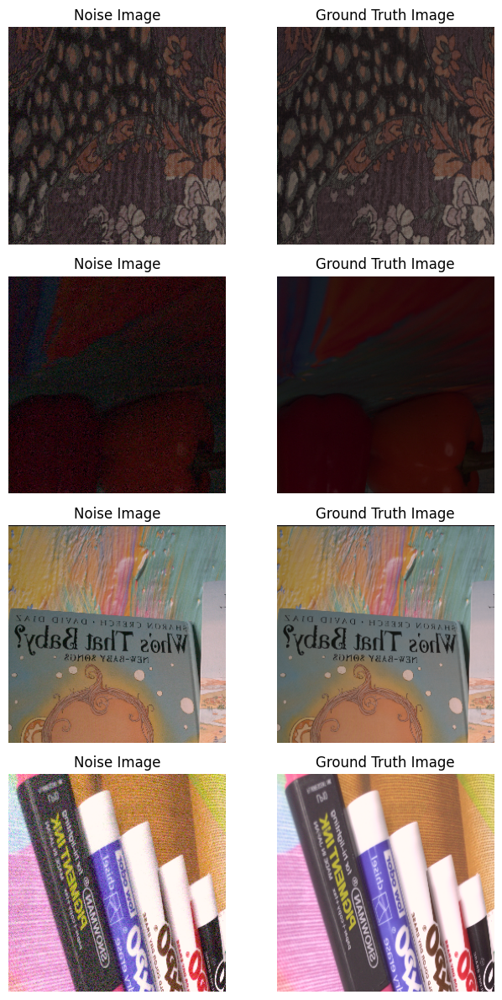

In [9]:
for sat_image, mask_image in train_loader:
    show_image_pairs(sat_image, mask_image)
    break

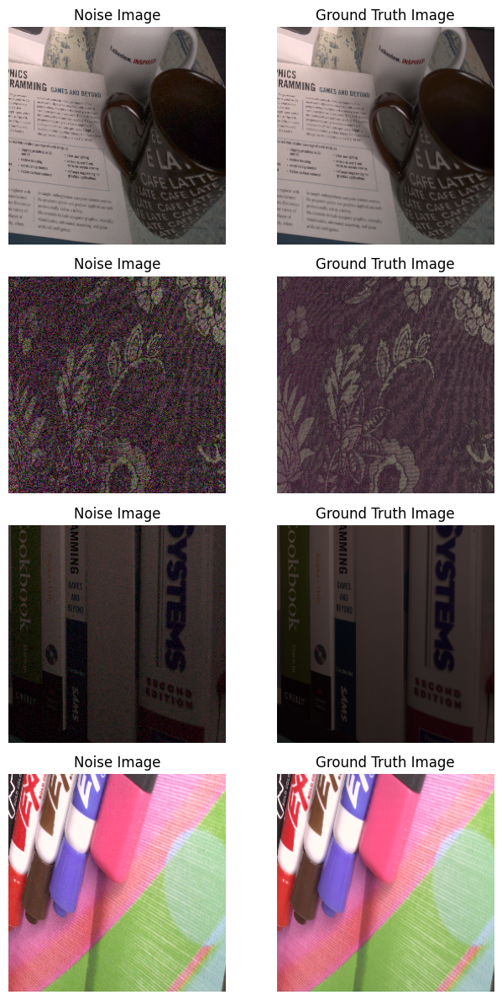

In [10]:
for sat_image, mask_image in valid_loader:
    show_image_pairs(sat_image, mask_image)
    break

In [11]:
# for sat_image, mask_image in test_loader:
#     show_image_pairs(sat_image, mask_image)
#     break

In [ ]:
FILTER = 32

In [13]:
class LayerNormFunction(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, weight, bias, eps):
        ctx.eps = eps
        N, C, H, W = x.size()
        mu = x.mean(1, keepdim=True)
        var = (x - mu).pow(2).mean(1, keepdim=True)
        y = (x - mu) / (var + eps).sqrt()
        ctx.save_for_backward(y, var, weight)
        y = weight.view(1, C, 1, 1) * y + bias.view(1, C, 1, 1)
        return y

    @staticmethod
    def backward(ctx, grad_output):
        eps = ctx.eps

        N, C, H, W = grad_output.size()
        y, var, weight = ctx.saved_variables
        g = grad_output * weight.view(1, C, 1, 1)
        mean_g = g.mean(dim=1, keepdim=True)

        mean_gy = (g * y).mean(dim=1, keepdim=True)
        gx = 1. / torch.sqrt(var + eps) * (g - y * mean_gy - mean_g)
        return gx, (grad_output * y).sum(dim=3).sum(dim=2).sum(dim=0), grad_output.sum(dim=3).sum(dim=2).sum(
            dim=0), None

class LayerNorm2d(nn.Module):

    def __init__(self, channels, eps=1e-6):
        super(LayerNorm2d, self).__init__()
        self.register_parameter('weight', nn.Parameter(torch.ones(channels)))
        self.register_parameter('bias', nn.Parameter(torch.zeros(channels)))
        self.eps = eps

    def forward(self, x):
        return LayerNormFunction.apply(x, self.weight, self.bias, self.eps)
def replace_layers(model, base_size, train_size, fast_imp, **kwargs):
    for n, m in model.named_children():
        if len(list(m.children())) > 0:
            ## compound module, go inside it
            replace_layers(m, base_size, train_size, fast_imp, **kwargs)

        if isinstance(m, nn.AdaptiveAvgPool2d):
            pool = AvgPool2d(base_size=base_size, fast_imp=fast_imp, train_size=train_size)
            assert m.output_size == 1
            setattr(model, n, pool)

class Local_Base():
    def convert(self, *args, train_size, **kwargs):
        replace_layers(self, *args, train_size=train_size, **kwargs)
        imgs = torch.rand(train_size)
        with torch.no_grad():
            self.forward(imgs)

class SimpleGate(nn.Module):
    def forward(self, x):
        x1, x2 = x.chunk(2, dim=1)
        return x1 * x2

class NAFBlock(nn.Module):
    def __init__(self, c, DW_Expand=2, FFN_Expand=2, drop_out_rate=0.):
        super().__init__()
        dw_channel = c * DW_Expand
        self.conv1 = nn.Conv2d(in_channels=c, out_channels=dw_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv2 = nn.Conv2d(in_channels=dw_channel, out_channels=dw_channel, kernel_size=3, padding=1, stride=1, groups=dw_channel,
                               bias=True)
        self.conv3 = nn.Conv2d(in_channels=dw_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        # Simplified Channel Attention
        self.sca = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels=dw_channel // 2, out_channels=dw_channel // 2, kernel_size=1, padding=0, stride=1,
                      groups=1, bias=True),
        )

        # SimpleGate
        self.sg = SimpleGate()

        ffn_channel = FFN_Expand * c
        self.conv4 = nn.Conv2d(in_channels=c, out_channels=ffn_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv5 = nn.Conv2d(in_channels=ffn_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        self.norm1 = LayerNorm2d(c)
        self.norm2 = LayerNorm2d(c)

        self.dropout1 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()
        self.dropout2 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()

        self.beta = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)
        self.gamma = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)

    def forward(self, inp):
        x = inp

        x = self.norm1(x)

        x = self.conv1(x)
        x = self.conv2(x)
        x = self.sg(x)
        x = x * self.sca(x)
        x = self.conv3(x)

        x = self.dropout1(x)

        y = inp + x * self.beta

        x = self.conv4(self.norm2(y))
        x = self.sg(x)
        x = self.conv5(x)

        x = self.dropout2(x)

        return y + x * self.gamma

class HalfUNet(nn.Module):
    def __init__(self, input_channels=3):
        super(HalfUNet, self).__init__()
        self.initial = nn.Conv2d(3, FILTER, 1, 1)
        self.conv1 = nn.Sequential(
            NAFBlock(FILTER),
            NAFBlock(FILTER)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Sequential(
            NAFBlock(FILTER),
            NAFBlock(FILTER)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = nn.Sequential(
            NAFBlock(FILTER),
            NAFBlock(FILTER)
        )

        self.conv_up3 = nn.Conv2d(FILTER, FILTER * 16, 1, bias=False)
        self.up3 = nn.PixelShuffle(4)
        self.conv_up2 = nn.Conv2d(FILTER, FILTER * 4, 1, bias=False)
        self.up2 = nn.PixelShuffle(2)
        self.final_conv = nn.Conv2d(FILTER, 3, kernel_size=1)
        # If you want to perform multi-class segmentation, change the output channels to the desired number

    def forward(self, x):
        x = self.initial(x)
        x1 = self.conv1(x)
        pool1 = self.pool1(x1)
        x2 = self.conv2(pool1)
        pool2 = self.pool2(x2)
        x3 = self.conv3(pool2)

        up3 = self.conv_up3(x3)
        up3 = self.up3(up3)

        up2 = self.conv_up2(x2)
        up2 = self.up2(up2)
        up_scaled = x1 + up2 + up3
        output = self.final_conv(up_scaled)
        return output

# Example usage:
input_tensor = torch.randn(1, 3, 256, 256)  # Example input tensor
model = HalfUNet()
output_tensor = model(input_tensor)
print(output_tensor.shape)  # Print the shape of the output tensor

torch.Size([1, 3, 256, 256])


In [14]:
model.eval()

HalfUNet(
  (initial): Conv2d(3, 128, kernel_size=(1, 1), stride=(1, 1))
  (conv1): Sequential(
    (0): NAFBlock(
      (conv1): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1))
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=256)
      (conv3): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
      (sca): Sequential(
        (0): AdaptiveAvgPool2d(output_size=1)
        (1): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
      )
      (sg): SimpleGate()
      (conv4): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1))
      (conv5): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
      (norm1): LayerNorm2d()
      (norm2): LayerNorm2d()
      (dropout1): Identity()
      (dropout2): Identity()
    )
    (1): NAFBlock(
      (conv1): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1))
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=256)
      (conv3): Conv2d(128, 128, kernel_size=(1, 1)

In [15]:
# def get_model_params(model):
#     total_params = sum(p.numel() for p in model.parameters())
#     trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
#     return total_params, trainable_params


# # Calculate and print model parameters
# total_params, trainable_params = get_model_params(model)
# print(f"Total parameters: {total_params}")
# print(f"Trainable parameters: {trainable_params}")

In [16]:
from torchmetrics.image import StructuralSimilarityIndexMeasure

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

def psnr(img1, img2, data_range=1.0):
    mse = F.mse_loss(img1, img2)
    psnr_val = 20 * torch.log10(data_range / torch.sqrt(mse))
    return psnr_val

def loss_func(x, y):
    return 100 - psnr(x, y)

In [17]:
# pretrained_weights = torch.load('/kaggle/working/naf_128.pth', map_location=device)

# # Remove the 'module.' prefix from the keys
# new_state_dict = {}
# for k, v in pretrained_weights.items():
#     new_key = k.replace('module.', '')
#     new_state_dict[new_key] = v

# # Load the state dict into the model
# model.load_state_dict(new_state_dict)

# # Now the model is ready to use
# model.eval()

In [18]:
def evaluate_model(model, dataloader, device=device):
    model.to(device)
    model.eval()
    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = model(inputs)

            loss_val = loss_func(outputs, targets)
            psnr_val = psnr(outputs, targets)
            ssim_val = ssim(outputs, targets)

            total_loss += loss_val.item()
            total_psnr += psnr_val.item()
            total_ssim += ssim_val.item()

    avg_loss = total_loss / len(dataloader)
    avg_psnr = total_psnr / len(dataloader)
    avg_ssim = total_ssim / len(dataloader)

    return avg_loss, avg_psnr, avg_ssim

In [19]:
train_loss = []
train_psnr = []
train_ssim = []
val_loss = []
val_psnr = []
val_ssim = []

In [ ]:
if torch.cuda.device_count() > 1:
    model = torch.nn.DataParallel(model)

model = model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

num_epochs = 100
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train()

    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    loop = tqdm(enumerate(train_loader), total=len(train_loader))
    for batch_idx, (inputs, targets) in loop:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = model(inputs)

        loss = loss_func(outputs, targets)
        psnr_val = psnr(outputs, targets)
        ssim_val = ssim(outputs, targets)

        total_loss += loss.item()
        total_psnr += psnr_val.item()
        total_ssim += ssim_val.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loop.set_description(f'Step [{batch_idx+1}/{len(train_loader)}]')
        loop.set_postfix(loss=loss.item(), psnr=psnr_val.item(), ssim=ssim_val.item())

    avg_loss = total_loss / len(train_loader)
    avg_psnr = total_psnr / len(train_loader)
    avg_ssim = total_ssim / len(train_loader)

    print(f"\nAvg Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}")

    avg_loss_val, avg_psnr_val, avg_ssim_val = evaluate_model(model, valid_loader, device)
    print(f"Val Loss: {avg_loss_val}, Val PSNR: {avg_psnr_val:.4f}, Val SSIM: {avg_ssim_val:.4f}")

    train_loss.append(avg_loss)
    train_psnr.append(avg_psnr)
    train_ssim.append(avg_ssim)
    val_loss.append(avg_loss_val)
    val_psnr.append(avg_psnr_val)
    val_ssim.append(avg_ssim_val)

    torch.save(model.state_dict(), 'naf_32_double.pth')

Epoch 1/100


  0%|          | 0/96 [00:00<?, ?it/s]/tmp/ipykernel_26/3214558721.py:18: DeprecationWarning: 'saved_variables' is deprecated; use 'saved_tensors'
  y, var, weight = ctx.saved_variables
Step [96/96]: 100%|██████████| 96/96 [01:32<00:00,  1.04it/s, loss=69.7, psnr=30.3, ssim=0.813]



Avg Loss: 73.6555, Avg PSNR: 26.3445, Avg SSIM: 0.5923
Val Loss: 71.03544998168945, Val PSNR: 28.9645, Val SSIM: 0.7699
Epoch 2/100


Step [96/96]: 100%|██████████| 96/96 [01:41<00:00,  1.05s/it, loss=69.3, psnr=30.7, ssim=0.795]



Avg Loss: 69.7054, Avg PSNR: 30.2946, Avg SSIM: 0.7976
Val Loss: 68.64238357543945, Val PSNR: 31.3576, Val SSIM: 0.8192
Epoch 3/100


Step [96/96]: 100%|██████████| 96/96 [01:41<00:00,  1.06s/it, loss=67.2, psnr=32.8, ssim=0.846]



Avg Loss: 68.2125, Avg PSNR: 31.7875, Avg SSIM: 0.8470
Val Loss: 67.84823226928711, Val PSNR: 32.1518, Val SSIM: 0.8489
Epoch 4/100


Step [96/96]: 100%|██████████| 96/96 [01:41<00:00,  1.06s/it, loss=68.5, psnr=31.5, ssim=0.862]



Avg Loss: 66.8962, Avg PSNR: 33.1038, Avg SSIM: 0.8663
Val Loss: 69.0123062133789, Val PSNR: 30.9877, Val SSIM: 0.8527
Epoch 5/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.3, psnr=34.7, ssim=0.909]



Avg Loss: 66.7083, Avg PSNR: 33.2917, Avg SSIM: 0.8725
Val Loss: 66.7064208984375, Val PSNR: 33.2936, Val SSIM: 0.8703
Epoch 6/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.4, psnr=34.6, ssim=0.913]



Avg Loss: 66.0739, Avg PSNR: 33.9261, Avg SSIM: 0.8830
Val Loss: 66.95294952392578, Val PSNR: 33.0471, Val SSIM: 0.8752
Epoch 7/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=66.9, psnr=33.1, ssim=0.867]



Avg Loss: 65.8833, Avg PSNR: 34.1167, Avg SSIM: 0.8862
Val Loss: 66.14843368530273, Val PSNR: 33.8516, Val SSIM: 0.8815
Epoch 8/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.4, psnr=35.6, ssim=0.888]



Avg Loss: 65.6731, Avg PSNR: 34.3269, Avg SSIM: 0.8904
Val Loss: 65.99631118774414, Val PSNR: 34.0037, Val SSIM: 0.8833
Epoch 9/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.5, psnr=34.5, ssim=0.909]



Avg Loss: 65.3928, Avg PSNR: 34.6072, Avg SSIM: 0.8940
Val Loss: 65.93734550476074, Val PSNR: 34.0627, Val SSIM: 0.8875
Epoch 10/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=66.1, psnr=33.9, ssim=0.864]



Avg Loss: 65.1242, Avg PSNR: 34.8758, Avg SSIM: 0.8972
Val Loss: 65.92308044433594, Val PSNR: 34.0769, Val SSIM: 0.8901
Epoch 11/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=64.8, psnr=35.2, ssim=0.896]



Avg Loss: 65.0006, Avg PSNR: 34.9994, Avg SSIM: 0.9005
Val Loss: 65.85112380981445, Val PSNR: 34.1489, Val SSIM: 0.8890
Epoch 12/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.2, psnr=34.8, ssim=0.894]



Avg Loss: 64.8800, Avg PSNR: 35.1200, Avg SSIM: 0.9025
Val Loss: 65.46866035461426, Val PSNR: 34.5313, Val SSIM: 0.8962
Epoch 13/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=66.6, psnr=33.4, ssim=0.882]



Avg Loss: 64.7040, Avg PSNR: 35.2960, Avg SSIM: 0.9049
Val Loss: 65.91914367675781, Val PSNR: 34.0809, Val SSIM: 0.8956
Epoch 14/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65, psnr=35, ssim=0.918]



Avg Loss: 64.8969, Avg PSNR: 35.1031, Avg SSIM: 0.9057
Val Loss: 65.4257984161377, Val PSNR: 34.5742, Val SSIM: 0.8991
Epoch 15/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.5, psnr=36.5, ssim=0.919]



Avg Loss: 64.6531, Avg PSNR: 35.3469, Avg SSIM: 0.9074
Val Loss: 65.24214172363281, Val PSNR: 34.7579, Val SSIM: 0.9013
Epoch 16/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.7, psnr=35.3, ssim=0.916]



Avg Loss: 64.3658, Avg PSNR: 35.6342, Avg SSIM: 0.9095
Val Loss: 65.26542282104492, Val PSNR: 34.7346, Val SSIM: 0.9035
Epoch 17/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.8, psnr=34.2, ssim=0.899]



Avg Loss: 64.5800, Avg PSNR: 35.4200, Avg SSIM: 0.9087
Val Loss: 65.13448524475098, Val PSNR: 34.8655, Val SSIM: 0.9036
Epoch 18/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.8, psnr=34.2, ssim=0.891]



Avg Loss: 64.2818, Avg PSNR: 35.7182, Avg SSIM: 0.9117
Val Loss: 65.13966369628906, Val PSNR: 34.8603, Val SSIM: 0.9037
Epoch 19/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.9, psnr=35.1, ssim=0.907]



Avg Loss: 64.7352, Avg PSNR: 35.2648, Avg SSIM: 0.9105
Val Loss: 65.16617584228516, Val PSNR: 34.8338, Val SSIM: 0.9036
Epoch 20/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.5, psnr=35.5, ssim=0.914]



Avg Loss: 64.1519, Avg PSNR: 35.8481, Avg SSIM: 0.9133
Val Loss: 65.15722465515137, Val PSNR: 34.8428, Val SSIM: 0.9068
Epoch 21/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.2, psnr=36.8, ssim=0.914]



Avg Loss: 64.2417, Avg PSNR: 35.7583, Avg SSIM: 0.9138
Val Loss: 65.03705024719238, Val PSNR: 34.9630, Val SSIM: 0.9071
Epoch 22/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.6, psnr=38.4, ssim=0.947]



Avg Loss: 64.0990, Avg PSNR: 35.9010, Avg SSIM: 0.9146
Val Loss: 64.99000549316406, Val PSNR: 35.0100, Val SSIM: 0.9064
Epoch 23/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.9, psnr=36.1, ssim=0.922]



Avg Loss: 64.1888, Avg PSNR: 35.8112, Avg SSIM: 0.9147
Val Loss: 64.92576026916504, Val PSNR: 35.0742, Val SSIM: 0.9077
Epoch 24/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.4, psnr=36.6, ssim=0.917]



Avg Loss: 63.9158, Avg PSNR: 36.0842, Avg SSIM: 0.9167
Val Loss: 65.3060359954834, Val PSNR: 34.6940, Val SSIM: 0.9102
Epoch 25/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.8, psnr=37.2, ssim=0.943]



Avg Loss: 64.3556, Avg PSNR: 35.6444, Avg SSIM: 0.9148
Val Loss: 64.6795539855957, Val PSNR: 35.3204, Val SSIM: 0.9100
Epoch 26/100


Step [96/96]: 100%|██████████| 96/96 [01:41<00:00,  1.06s/it, loss=63.4, psnr=36.6, ssim=0.932]



Avg Loss: 63.9454, Avg PSNR: 36.0546, Avg SSIM: 0.9172
Val Loss: 64.7344913482666, Val PSNR: 35.2655, Val SSIM: 0.9113
Epoch 27/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63, psnr=37, ssim=0.928]



Avg Loss: 63.8284, Avg PSNR: 36.1716, Avg SSIM: 0.9179
Val Loss: 64.84471130371094, Val PSNR: 35.1553, Val SSIM: 0.9104
Epoch 28/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.6, psnr=35.4, ssim=0.907]



Avg Loss: 63.8671, Avg PSNR: 36.1329, Avg SSIM: 0.9183
Val Loss: 64.65210342407227, Val PSNR: 35.3479, Val SSIM: 0.9116
Epoch 29/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=61.8, psnr=38.2, ssim=0.955]



Avg Loss: 63.7977, Avg PSNR: 36.2023, Avg SSIM: 0.9188
Val Loss: 64.74417495727539, Val PSNR: 35.2558, Val SSIM: 0.9118
Epoch 30/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.1, psnr=34.9, ssim=0.89]



Avg Loss: 63.7246, Avg PSNR: 36.2754, Avg SSIM: 0.9194
Val Loss: 64.73459053039551, Val PSNR: 35.2654, Val SSIM: 0.9134
Epoch 31/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.2, psnr=36.8, ssim=0.936]



Avg Loss: 63.6937, Avg PSNR: 36.3063, Avg SSIM: 0.9199
Val Loss: 64.51623439788818, Val PSNR: 35.4838, Val SSIM: 0.9133
Epoch 32/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.6, psnr=35.4, ssim=0.903]



Avg Loss: 63.8675, Avg PSNR: 36.1325, Avg SSIM: 0.9194
Val Loss: 64.94817924499512, Val PSNR: 35.0518, Val SSIM: 0.9124
Epoch 33/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.7, psnr=36.3, ssim=0.924]



Avg Loss: 63.6613, Avg PSNR: 36.3387, Avg SSIM: 0.9205
Val Loss: 64.7233190536499, Val PSNR: 35.2767, Val SSIM: 0.9134
Epoch 34/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=65.1, psnr=34.9, ssim=0.901]



Avg Loss: 63.5249, Avg PSNR: 36.4751, Avg SSIM: 0.9213
Val Loss: 64.60970687866211, Val PSNR: 35.3903, Val SSIM: 0.9151
Epoch 35/100


Step [96/96]: 100%|██████████| 96/96 [01:41<00:00,  1.06s/it, loss=64.8, psnr=35.2, ssim=0.923]



Avg Loss: 63.5893, Avg PSNR: 36.4107, Avg SSIM: 0.9207
Val Loss: 64.86277198791504, Val PSNR: 35.1372, Val SSIM: 0.9150
Epoch 36/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=64.5, psnr=35.5, ssim=0.917]



Avg Loss: 63.5912, Avg PSNR: 36.4088, Avg SSIM: 0.9215
Val Loss: 64.8564338684082, Val PSNR: 35.1436, Val SSIM: 0.9155
Epoch 37/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.8, psnr=35.2, ssim=0.904]



Avg Loss: 63.6687, Avg PSNR: 36.3313, Avg SSIM: 0.9215
Val Loss: 64.93381881713867, Val PSNR: 35.0662, Val SSIM: 0.9134
Epoch 38/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.9, psnr=36.1, ssim=0.936]



Avg Loss: 63.5863, Avg PSNR: 36.4137, Avg SSIM: 0.9219
Val Loss: 64.71010398864746, Val PSNR: 35.2899, Val SSIM: 0.9161
Epoch 39/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.4, psnr=38.6, ssim=0.949]



Avg Loss: 63.6915, Avg PSNR: 36.3085, Avg SSIM: 0.9215
Val Loss: 64.70225620269775, Val PSNR: 35.2977, Val SSIM: 0.9164
Epoch 40/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.5, psnr=35.5, ssim=0.902]



Avg Loss: 63.5201, Avg PSNR: 36.4799, Avg SSIM: 0.9221
Val Loss: 64.43197536468506, Val PSNR: 35.5680, Val SSIM: 0.9132
Epoch 41/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.1, psnr=36.9, ssim=0.925]



Avg Loss: 63.4343, Avg PSNR: 36.5657, Avg SSIM: 0.9230
Val Loss: 64.58813667297363, Val PSNR: 35.4119, Val SSIM: 0.9170
Epoch 42/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=64.5, psnr=35.5, ssim=0.916]



Avg Loss: 63.6429, Avg PSNR: 36.3571, Avg SSIM: 0.9222
Val Loss: 64.76513290405273, Val PSNR: 35.2349, Val SSIM: 0.9158
Epoch 43/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61, psnr=39, ssim=0.949]



Avg Loss: 63.6038, Avg PSNR: 36.3962, Avg SSIM: 0.9225
Val Loss: 64.56794166564941, Val PSNR: 35.4321, Val SSIM: 0.9165
Epoch 44/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.3, psnr=36.7, ssim=0.942]



Avg Loss: 63.7199, Avg PSNR: 36.2801, Avg SSIM: 0.9223
Val Loss: 64.71335887908936, Val PSNR: 35.2866, Val SSIM: 0.9153
Epoch 45/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.3, psnr=36.7, ssim=0.921]



Avg Loss: 63.4457, Avg PSNR: 36.5543, Avg SSIM: 0.9234
Val Loss: 64.50263786315918, Val PSNR: 35.4974, Val SSIM: 0.9176
Epoch 46/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.2, psnr=37.8, ssim=0.944]



Avg Loss: 63.2582, Avg PSNR: 36.7418, Avg SSIM: 0.9245
Val Loss: 64.4296875, Val PSNR: 35.5703, Val SSIM: 0.9172
Epoch 47/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=64.6, psnr=35.4, ssim=0.906]



Avg Loss: 63.2810, Avg PSNR: 36.7190, Avg SSIM: 0.9244
Val Loss: 64.48598289489746, Val PSNR: 35.5140, Val SSIM: 0.9183
Epoch 48/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.8, psnr=36.2, ssim=0.909]



Avg Loss: 63.3988, Avg PSNR: 36.6012, Avg SSIM: 0.9240
Val Loss: 64.40594482421875, Val PSNR: 35.5941, Val SSIM: 0.9163
Epoch 49/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.1, psnr=37.9, ssim=0.948]



Avg Loss: 63.3280, Avg PSNR: 36.6720, Avg SSIM: 0.9245
Val Loss: 64.50863552093506, Val PSNR: 35.4914, Val SSIM: 0.9184
Epoch 50/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.8, psnr=35.2, ssim=0.916]



Avg Loss: 63.3245, Avg PSNR: 36.6755, Avg SSIM: 0.9247
Val Loss: 64.73846054077148, Val PSNR: 35.2615, Val SSIM: 0.9164
Epoch 51/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.4, psnr=37.6, ssim=0.945]



Avg Loss: 63.4038, Avg PSNR: 36.5963, Avg SSIM: 0.9244
Val Loss: 64.7817440032959, Val PSNR: 35.2183, Val SSIM: 0.9167
Epoch 52/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.9, psnr=38.1, ssim=0.951]



Avg Loss: 63.5200, Avg PSNR: 36.4800, Avg SSIM: 0.9243
Val Loss: 64.40451335906982, Val PSNR: 35.5955, Val SSIM: 0.9173
Epoch 53/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.4, psnr=36.6, ssim=0.916]



Avg Loss: 63.4664, Avg PSNR: 36.5336, Avg SSIM: 0.9246
Val Loss: 64.93953514099121, Val PSNR: 35.0605, Val SSIM: 0.9146
Epoch 54/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.6, psnr=36.4, ssim=0.927]



Avg Loss: 63.4204, Avg PSNR: 36.5796, Avg SSIM: 0.9245
Val Loss: 64.47077560424805, Val PSNR: 35.5292, Val SSIM: 0.9179
Epoch 55/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.8, psnr=38.2, ssim=0.942]



Avg Loss: 63.1635, Avg PSNR: 36.8365, Avg SSIM: 0.9259
Val Loss: 64.27678203582764, Val PSNR: 35.7232, Val SSIM: 0.9197
Epoch 56/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=65, psnr=35, ssim=0.907]



Avg Loss: 63.4124, Avg PSNR: 36.5876, Avg SSIM: 0.9251
Val Loss: 64.44581317901611, Val PSNR: 35.5542, Val SSIM: 0.9188
Epoch 57/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=62.5, psnr=37.5, ssim=0.937]



Avg Loss: 63.2439, Avg PSNR: 36.7561, Avg SSIM: 0.9255
Val Loss: 64.45362186431885, Val PSNR: 35.5464, Val SSIM: 0.9188
Epoch 58/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.3, psnr=36.7, ssim=0.936]



Avg Loss: 63.3828, Avg PSNR: 36.6172, Avg SSIM: 0.9252
Val Loss: 64.42544364929199, Val PSNR: 35.5746, Val SSIM: 0.9199
Epoch 59/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.9, psnr=36.1, ssim=0.913]



Avg Loss: 63.2676, Avg PSNR: 36.7324, Avg SSIM: 0.9259
Val Loss: 64.28323745727539, Val PSNR: 35.7168, Val SSIM: 0.9197
Epoch 60/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.9, psnr=37.1, ssim=0.95]



Avg Loss: 63.2479, Avg PSNR: 36.7521, Avg SSIM: 0.9260
Val Loss: 64.29015636444092, Val PSNR: 35.7098, Val SSIM: 0.9194
Epoch 61/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.2, psnr=35.8, ssim=0.922]



Avg Loss: 63.3300, Avg PSNR: 36.6700, Avg SSIM: 0.9254
Val Loss: 64.26422882080078, Val PSNR: 35.7358, Val SSIM: 0.9206
Epoch 62/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=62.5, psnr=37.5, ssim=0.942]



Avg Loss: 63.0764, Avg PSNR: 36.9236, Avg SSIM: 0.9270
Val Loss: 64.17674922943115, Val PSNR: 35.8233, Val SSIM: 0.9197
Epoch 63/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.7, psnr=37.3, ssim=0.934]



Avg Loss: 63.3967, Avg PSNR: 36.6033, Avg SSIM: 0.9256
Val Loss: 64.52884101867676, Val PSNR: 35.4712, Val SSIM: 0.9190
Epoch 64/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=61.3, psnr=38.7, ssim=0.952]



Avg Loss: 63.1593, Avg PSNR: 36.8407, Avg SSIM: 0.9265
Val Loss: 64.04499912261963, Val PSNR: 35.9550, Val SSIM: 0.9202
Epoch 65/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.5, psnr=36.5, ssim=0.919]



Avg Loss: 63.0066, Avg PSNR: 36.9934, Avg SSIM: 0.9276
Val Loss: 64.26589584350586, Val PSNR: 35.7341, Val SSIM: 0.9199
Epoch 66/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.9, psnr=37.1, ssim=0.946]



Avg Loss: 63.1740, Avg PSNR: 36.8260, Avg SSIM: 0.9265
Val Loss: 64.33613014221191, Val PSNR: 35.6639, Val SSIM: 0.9209
Epoch 67/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64, psnr=36, ssim=0.924]



Avg Loss: 63.0617, Avg PSNR: 36.9383, Avg SSIM: 0.9275
Val Loss: 64.29912281036377, Val PSNR: 35.7009, Val SSIM: 0.9208
Epoch 68/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61, psnr=39, ssim=0.951]



Avg Loss: 62.9903, Avg PSNR: 37.0097, Avg SSIM: 0.9276
Val Loss: 64.22891139984131, Val PSNR: 35.7711, Val SSIM: 0.9212
Epoch 69/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.4, psnr=38.6, ssim=0.947]



Avg Loss: 63.3039, Avg PSNR: 36.6961, Avg SSIM: 0.9266
Val Loss: 64.42717266082764, Val PSNR: 35.5728, Val SSIM: 0.9183
Epoch 70/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.6, psnr=38.4, ssim=0.943]



Avg Loss: 63.1933, Avg PSNR: 36.8067, Avg SSIM: 0.9269
Val Loss: 64.15650463104248, Val PSNR: 35.8435, Val SSIM: 0.9212
Epoch 71/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.9, psnr=38.1, ssim=0.943]



Avg Loss: 63.2325, Avg PSNR: 36.7675, Avg SSIM: 0.9266
Val Loss: 64.228928565979, Val PSNR: 35.7711, Val SSIM: 0.9199
Epoch 72/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.4, psnr=35.6, ssim=0.885]



Avg Loss: 62.9987, Avg PSNR: 37.0013, Avg SSIM: 0.9277
Val Loss: 64.27698135375977, Val PSNR: 35.7230, Val SSIM: 0.9216
Epoch 73/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.6, psnr=37.4, ssim=0.924]



Avg Loss: 62.9912, Avg PSNR: 37.0088, Avg SSIM: 0.9282
Val Loss: 64.42055606842041, Val PSNR: 35.5794, Val SSIM: 0.9207
Epoch 74/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.2, psnr=36.8, ssim=0.929]



Avg Loss: 63.2256, Avg PSNR: 36.7744, Avg SSIM: 0.9267
Val Loss: 64.09190368652344, Val PSNR: 35.9081, Val SSIM: 0.9203
Epoch 75/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=64.1, psnr=35.9, ssim=0.916]



Avg Loss: 63.0820, Avg PSNR: 36.9180, Avg SSIM: 0.9277
Val Loss: 64.3798131942749, Val PSNR: 35.6202, Val SSIM: 0.9207
Epoch 76/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=60.3, psnr=39.7, ssim=0.955]



Avg Loss: 63.0545, Avg PSNR: 36.9455, Avg SSIM: 0.9280
Val Loss: 64.17000484466553, Val PSNR: 35.8300, Val SSIM: 0.9213
Epoch 77/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.4, psnr=35.6, ssim=0.911]



Avg Loss: 62.8779, Avg PSNR: 37.1221, Avg SSIM: 0.9287
Val Loss: 64.12581825256348, Val PSNR: 35.8742, Val SSIM: 0.9218
Epoch 78/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=61.9, psnr=38.1, ssim=0.946]



Avg Loss: 63.0525, Avg PSNR: 36.9475, Avg SSIM: 0.9280
Val Loss: 64.07458400726318, Val PSNR: 35.9254, Val SSIM: 0.9215
Epoch 79/100


Step [96/96]: 100%|██████████| 96/96 [01:41<00:00,  1.06s/it, loss=62.6, psnr=37.4, ssim=0.936]



Avg Loss: 62.9858, Avg PSNR: 37.0142, Avg SSIM: 0.9286
Val Loss: 64.3587589263916, Val PSNR: 35.6412, Val SSIM: 0.9215
Epoch 80/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64, psnr=36, ssim=0.923]



Avg Loss: 63.1439, Avg PSNR: 36.8561, Avg SSIM: 0.9280
Val Loss: 64.28765392303467, Val PSNR: 35.7123, Val SSIM: 0.9211
Epoch 81/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.7, psnr=36.3, ssim=0.913]



Avg Loss: 63.0140, Avg PSNR: 36.9860, Avg SSIM: 0.9285
Val Loss: 64.15505027770996, Val PSNR: 35.8450, Val SSIM: 0.9218
Epoch 82/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.9, psnr=36.1, ssim=0.918]



Avg Loss: 62.9028, Avg PSNR: 37.0972, Avg SSIM: 0.9290
Val Loss: 63.96692657470703, Val PSNR: 36.0331, Val SSIM: 0.9231
Epoch 83/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63, psnr=37, ssim=0.919]



Avg Loss: 63.1690, Avg PSNR: 36.8310, Avg SSIM: 0.9279
Val Loss: 64.3026475906372, Val PSNR: 35.6974, Val SSIM: 0.9220
Epoch 84/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=62.4, psnr=37.6, ssim=0.923]



Avg Loss: 62.9112, Avg PSNR: 37.0888, Avg SSIM: 0.9290
Val Loss: 64.20005321502686, Val PSNR: 35.7999, Val SSIM: 0.9220
Epoch 85/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=64.3, psnr=35.7, ssim=0.91]



Avg Loss: 62.9225, Avg PSNR: 37.0775, Avg SSIM: 0.9292
Val Loss: 65.2314224243164, Val PSNR: 34.7686, Val SSIM: 0.9072
Epoch 86/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.5, psnr=37.5, ssim=0.946]



Avg Loss: 62.9248, Avg PSNR: 37.0752, Avg SSIM: 0.9286
Val Loss: 63.97563648223877, Val PSNR: 36.0244, Val SSIM: 0.9234
Epoch 87/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.5, psnr=36.5, ssim=0.93]



Avg Loss: 62.7868, Avg PSNR: 37.2132, Avg SSIM: 0.9298
Val Loss: 64.12296390533447, Val PSNR: 35.8770, Val SSIM: 0.9226
Epoch 88/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=63.4, psnr=36.6, ssim=0.928]



Avg Loss: 62.8219, Avg PSNR: 37.1781, Avg SSIM: 0.9298
Val Loss: 64.34934902191162, Val PSNR: 35.6507, Val SSIM: 0.9211
Epoch 89/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.8, psnr=36.2, ssim=0.936]



Avg Loss: 62.9759, Avg PSNR: 37.0241, Avg SSIM: 0.9289
Val Loss: 64.05278491973877, Val PSNR: 35.9472, Val SSIM: 0.9224
Epoch 90/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.3, psnr=36.7, ssim=0.939]



Avg Loss: 62.8768, Avg PSNR: 37.1232, Avg SSIM: 0.9295
Val Loss: 64.13853454589844, Val PSNR: 35.8615, Val SSIM: 0.9226
Epoch 91/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62, psnr=38, ssim=0.94]



Avg Loss: 62.9580, Avg PSNR: 37.0420, Avg SSIM: 0.9292
Val Loss: 64.42214584350586, Val PSNR: 35.5779, Val SSIM: 0.9213
Epoch 92/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.5, psnr=36.5, ssim=0.927]



Avg Loss: 63.1468, Avg PSNR: 36.8532, Avg SSIM: 0.9285
Val Loss: 63.97323226928711, Val PSNR: 36.0268, Val SSIM: 0.9234
Epoch 93/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.06s/it, loss=61.8, psnr=38.2, ssim=0.937]



Avg Loss: 62.9616, Avg PSNR: 37.0384, Avg SSIM: 0.9296
Val Loss: 64.23007869720459, Val PSNR: 35.7699, Val SSIM: 0.9237
Epoch 94/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.7, psnr=37.3, ssim=0.928]



Avg Loss: 63.0188, Avg PSNR: 36.9812, Avg SSIM: 0.9289
Val Loss: 64.14232921600342, Val PSNR: 35.8577, Val SSIM: 0.9211
Epoch 95/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62, psnr=38, ssim=0.946]



Avg Loss: 63.0425, Avg PSNR: 36.9575, Avg SSIM: 0.9291
Val Loss: 64.18212127685547, Val PSNR: 35.8179, Val SSIM: 0.9228
Epoch 96/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63, psnr=37, ssim=0.928]



Avg Loss: 62.8855, Avg PSNR: 37.1145, Avg SSIM: 0.9299
Val Loss: 63.90841293334961, Val PSNR: 36.0916, Val SSIM: 0.9234
Epoch 97/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=62.2, psnr=37.8, ssim=0.936]



Avg Loss: 62.7448, Avg PSNR: 37.2552, Avg SSIM: 0.9303
Val Loss: 63.78050136566162, Val PSNR: 36.2195, Val SSIM: 0.9242
Epoch 98/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.2, psnr=36.8, ssim=0.94]



Avg Loss: 62.7859, Avg PSNR: 37.2141, Avg SSIM: 0.9304
Val Loss: 64.15716743469238, Val PSNR: 35.8428, Val SSIM: 0.9221
Epoch 99/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.7, psnr=36.3, ssim=0.926]



Avg Loss: 62.8522, Avg PSNR: 37.1478, Avg SSIM: 0.9301
Val Loss: 64.11122131347656, Val PSNR: 35.8888, Val SSIM: 0.9235
Epoch 100/100


Step [96/96]: 100%|██████████| 96/96 [01:42<00:00,  1.07s/it, loss=63.4, psnr=36.6, ssim=0.928]



Avg Loss: 62.7802, Avg PSNR: 37.2198, Avg SSIM: 0.9304
Val Loss: 63.949137687683105, Val PSNR: 36.0509, Val SSIM: 0.9231


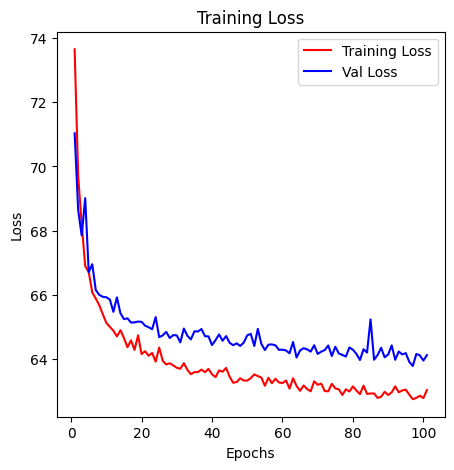

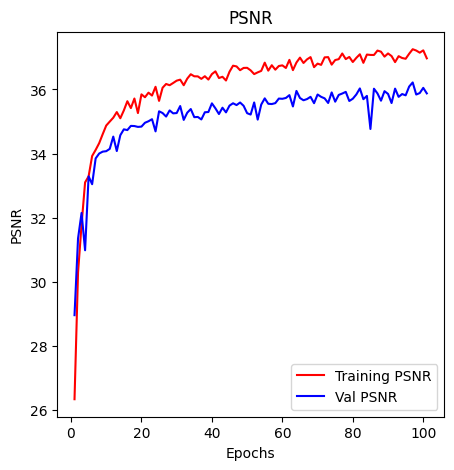

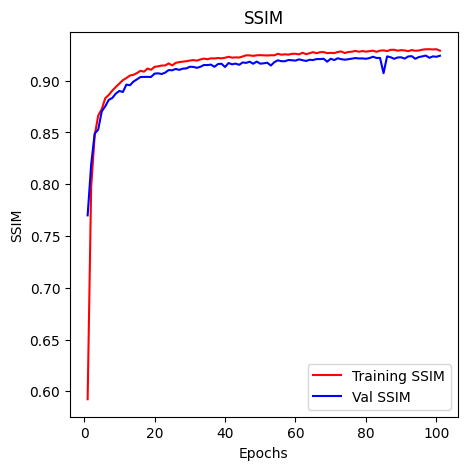

In [22]:
epochs = range(1, len(train_loss) + 1)

# Plotting train loss
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Val Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting train PSNR
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_psnr, 'r', label='Training PSNR')
plt.plot(epochs, val_psnr, 'b', label='Val PSNR')
plt.title('PSNR')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.show()

# Plotting train SSIM
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_ssim, 'r', label='Training SSIM')
plt.plot(epochs, val_ssim, 'b', label='Val SSIM')
plt.title('SSIM')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.show()

In [23]:
torch.cuda.empty_cache() 

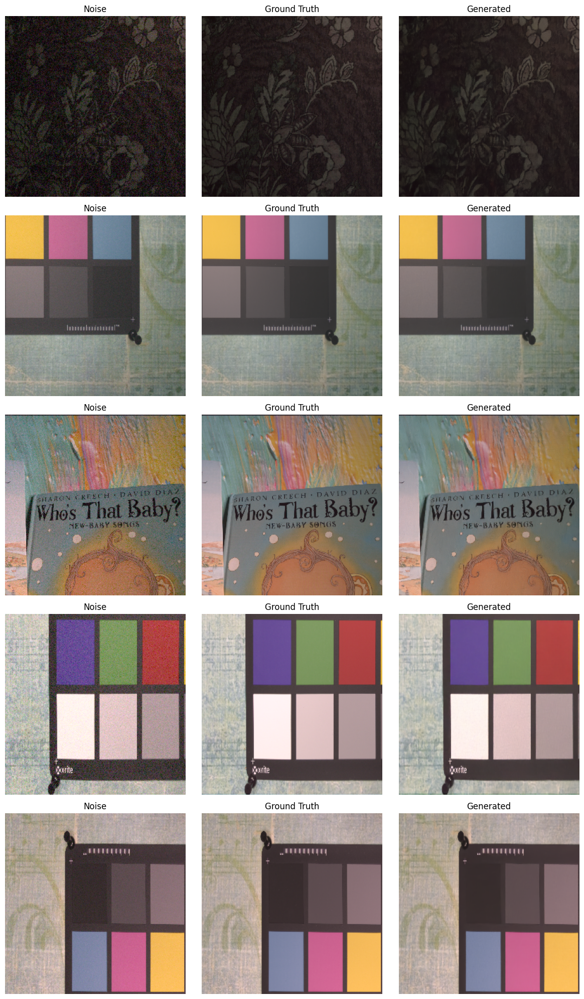

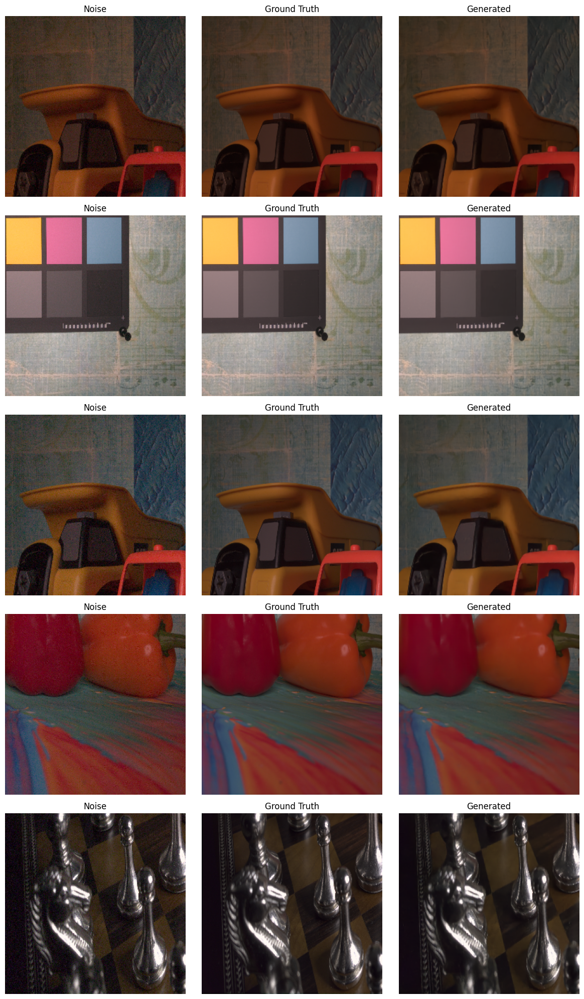

In [24]:
model = model.to('cpu')

# Ensure the model is not wrapped in DataParallel
if isinstance(model, torch.nn.DataParallel):
    model = model.module

model.eval()

# Iterate over a few batches from the test dataset
for batch_idx, (lr, hr) in enumerate(test_loader):
    # Move inputs to CPU
    imgs_lr = lr.cpu()
    imgs_hr = hr.cpu()

    # Forward pass: Generate high-resolution images
    with torch.no_grad():
        gen_hr = model(imgs_lr)

    # Visualize a few sample images
    num_samples = min(5, len(imgs_lr))  # Reduced number of samples for visualization

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 4))
    for i in range(num_samples):
        # Original LR image
        axes[i, 0].imshow(imgs_lr[i].permute(1, 2, 0).numpy())
        axes[i, 0].set_title("Noise")
        axes[i, 0].axis("off")

        # Ground truth HR image
        axes[i, 1].imshow(imgs_hr[i].permute(1, 2, 0).numpy())
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # Generated HR image
        axes[i, 2].imshow(gen_hr[i].permute(1, 2, 0).numpy())
        axes[i, 2].set_title("Generated")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

    # Explicitly delete variables to free memory
    del imgs_lr, imgs_hr, gen_hr

    # Only visualize a few batches
    if batch_idx == 1:
        break

In [25]:
evaluate_model(model, test_loader, device)

(62.070343017578125, 37.929656982421875, 0.9446625411510468)